## **Trabajo Práctico 1 - Panorámica**

In [1]:
import os
import sys
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
%load_ext autoreload
%autoreload 2

In [ ]:
from utils import (achicar, aplicar_anms, obtener_matches_cross_check, obtener_matches_flann_lowe, resumen_matches,
                   mostrar_imagen_con_grilla, dlt)

In [4]:
# Instalamos el paquete de utilidades
!pip install -qq git+https://github.com/udesa-vision/i308-utils.git

from i308_utils import imshow, show_images

#### *Carga de imagenes*

In [5]:
imagenes_cuadro = ['inputs/cuadro_0.jpg', 'inputs/cuadro_1.jpg', 'inputs/cuadro_2.jpg']
imagenes_udesa = ['inputs/udesa_0.jpg', 'inputs/udesa_1.jpg', 'inputs/udesa_2.jpg']

### *Detección de keypoints*

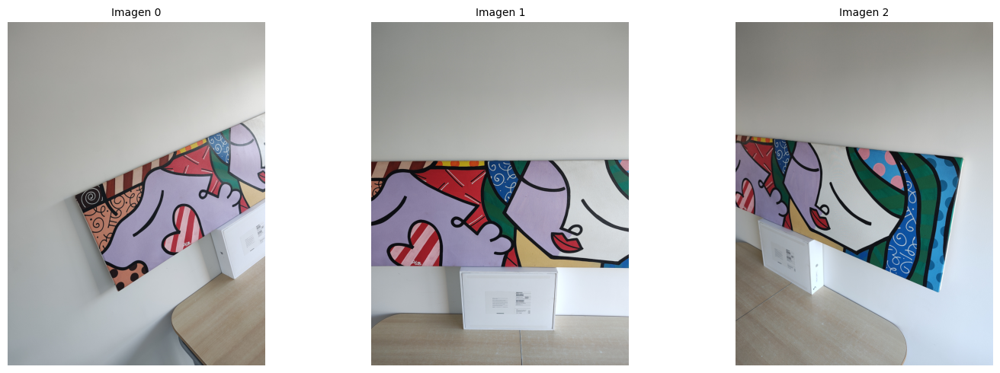

In [6]:
img0_cuadro_color = achicar(cv2.imread(imagenes_cuadro[0]))
img1_cuadro_color = achicar(cv2.imread(imagenes_cuadro[1]))
img2_cuadro_color = achicar(cv2.imread(imagenes_cuadro[2]))

show_images([img0_cuadro_color, img1_cuadro_color, img2_cuadro_color], titles=['Imagen 0', 'Imagen 1', 'Imagen 2'], figsize=(15,5))

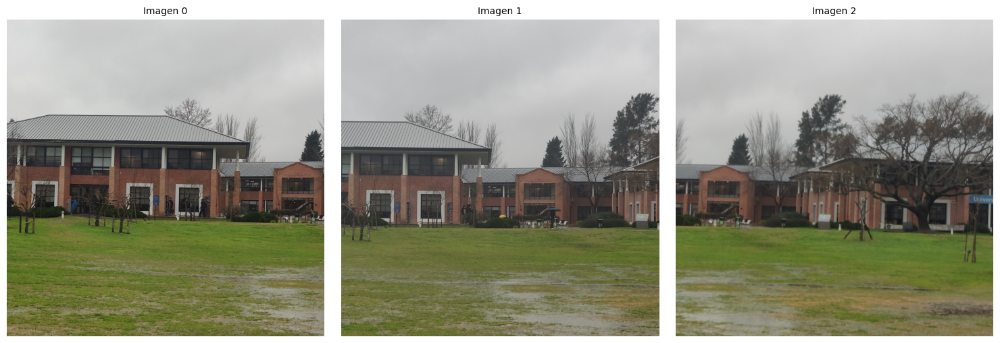

In [7]:
img0_udesa_color = achicar(cv2.imread(imagenes_udesa[0]))
img1_udesa_color = achicar(cv2.imread(imagenes_udesa[1]))
img2_udesa_color = achicar(cv2.imread(imagenes_udesa[2]))

show_images([img0_udesa_color, img1_udesa_color, img2_udesa_color], titles=['Imagen 0', 'Imagen 1', 'Imagen 2'], figsize=(15, 5))

In [8]:
# SIFT trabaja sobre gradientes de intensidad, por eso usamos escala de grises
img0_cuadro_gray = cv2.cvtColor(img0_cuadro_color, cv2.COLOR_BGR2GRAY)
img1_cuadro_gray = cv2.cvtColor(img1_cuadro_color, cv2.COLOR_BGR2GRAY)
img2_cuadro_gray = cv2.cvtColor(img2_cuadro_color, cv2.COLOR_BGR2GRAY)

In [9]:
img0_udesa_gray = cv2.cvtColor(img0_udesa_color, cv2.COLOR_BGR2GRAY)
img1_udesa_gray = cv2.cvtColor(img1_udesa_color, cv2.COLOR_BGR2GRAY)
img2_udesa_gray = cv2.cvtColor(img2_udesa_color, cv2.COLOR_BGR2GRAY)

In [10]:
# Creamos el detector de homografias SIFT entre las dos primeras imágenes
sift = cv2.SIFT_create()

In [11]:
# Detectamos keypoints y computamos los descriptores
keypoints0_cuadro, des0_cuadro = sift.detectAndCompute(img0_cuadro_gray, None)
keypoints1_cuadro, des1_cuadro = sift.detectAndCompute(img1_cuadro_gray, None)
keypoints2_cuadro, des2_cuadro = sift.detectAndCompute(img2_cuadro_gray, None)

keypoints0_udesa, des0_udesa = sift.detectAndCompute(img0_udesa_gray, None)
keypoints1_udesa, des1_udesa = sift.detectAndCompute(img1_udesa_gray, None)
keypoints2_udesa, des2_udesa = sift.detectAndCompute(img2_udesa_gray, None)

print('CUADRO')
print(f' largo keypoints0: {len(keypoints0_cuadro)}, largo keypoints1: {len(keypoints1_cuadro)}, largo keypoints2: {len(keypoints2_cuadro)}')
print('UDESA')
print(f' largo keypoints0: {len(keypoints0_udesa)}, largo keypoints1: {len(keypoints1_udesa)}, largo keypoints2: {len(keypoints2_udesa)}')

CUADRO
 largo keypoints0: 481, largo keypoints1: 450, largo keypoints2: 490
UDESA
 largo keypoints0: 3120, largo keypoints1: 3038, largo keypoints2: 2756


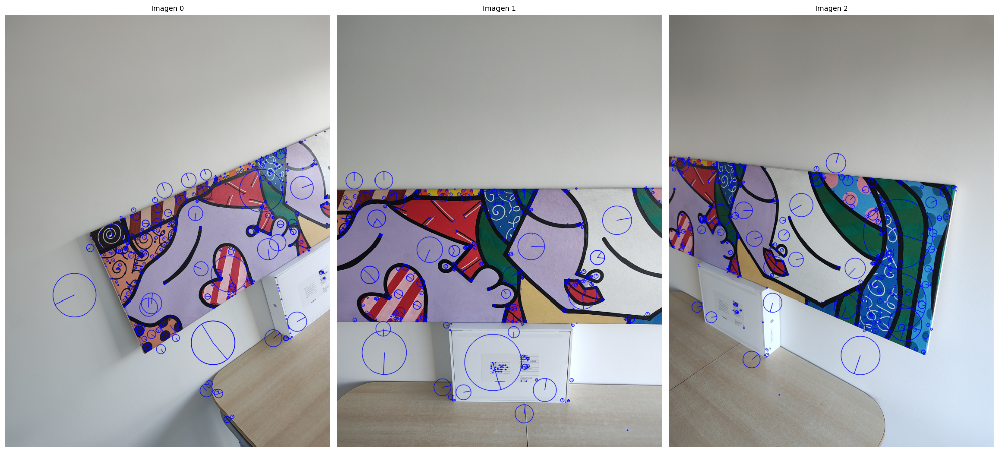

In [12]:
keypoints_img0_cuadro = cv2.drawKeypoints(img0_cuadro_color, keypoints0_cuadro, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

keypoints_img1_cuadro = cv2.drawKeypoints(img1_cuadro_color, keypoints1_cuadro, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

keypoints_img2_cuadro = cv2.drawKeypoints(img2_cuadro_color, keypoints2_cuadro, None, (255, 0, 0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

show_images([keypoints_img0_cuadro, keypoints_img1_cuadro, keypoints_img2_cuadro], titles=['Imagen 0', 'Imagen 1', 'Imagen 2'], figsize=(20, 10))

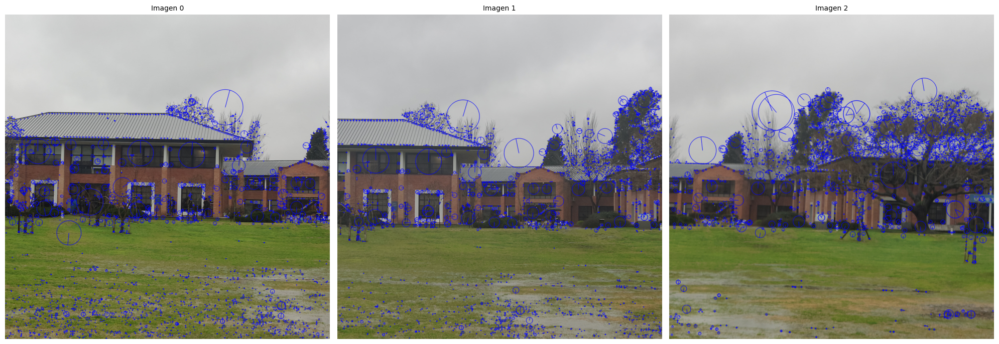

In [13]:
keypoints_img0_udesa = cv2.drawKeypoints(img0_udesa_color, keypoints0_udesa, 0, (255, 0, 0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
keypoints_img1_udesa = cv2.drawKeypoints(img1_udesa_color, keypoints1_udesa, 0, (255, 0, 0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
keypoints_img2_udesa = cv2.drawKeypoints(img2_udesa_color, keypoints2_udesa, 0, (255, 0, 0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

show_images([keypoints_img0_udesa, keypoints_img1_udesa, keypoints_img2_udesa], titles = ['Imagen 0', 'Imagen 1', 'Imagen 2'], figsize=(20,10))

### *Supresión de No-Máxima Adaptativa*

In [14]:
n_deseados = 200

keypoints0_cuadro_anms, des0_cuadro_anms = aplicar_anms(keypoints0_cuadro, des0_cuadro, n_deseados)
keypoints1_cuadro_anms, des1_cuadro_anms = aplicar_anms(keypoints1_cuadro, des1_cuadro, n_deseados)
keypoints2_cuadro_anms, des2_cuadro_anms = aplicar_anms(keypoints2_cuadro, des2_cuadro, n_deseados)

print(f'Antes: {len(keypoints0_cuadro)}, Después: {len(keypoints0_cuadro_anms)}')
print(f'Antes: {len(keypoints1_cuadro)}, Después: {len(keypoints1_cuadro_anms)}')
print(f'Antes: {len(keypoints2_cuadro)}, Después: {len(keypoints2_cuadro_anms)}')

Antes: 481, Después: 200
Antes: 450, Después: 200
Antes: 490, Después: 200


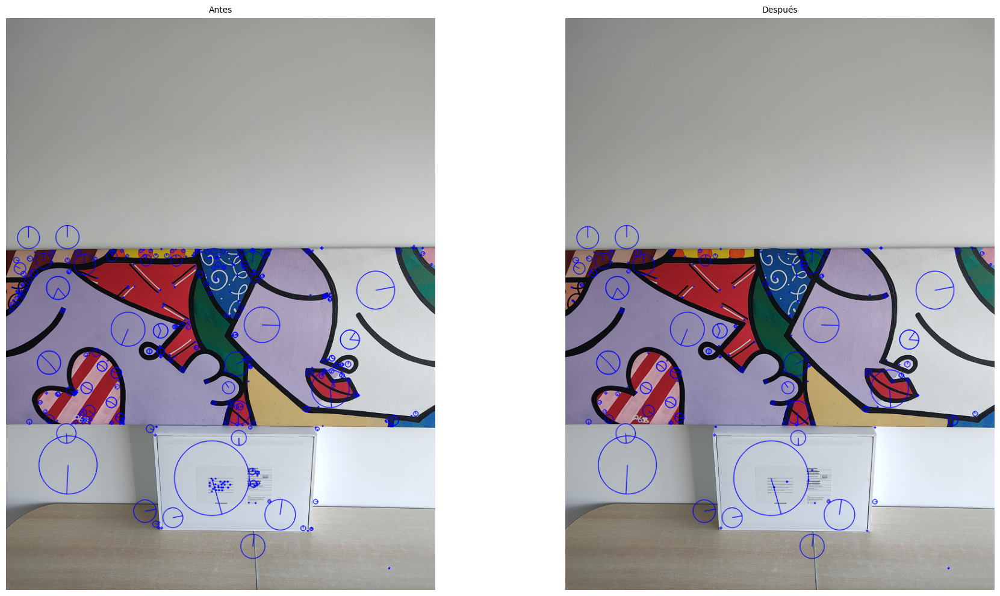

In [15]:
imagen1_cuadro_antes = cv2.drawKeypoints(img1_cuadro_color, keypoints1_cuadro, 0, (255, 0, 0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
imagen1_cuadro_despues = cv2.drawKeypoints(img1_cuadro_color, keypoints1_cuadro_anms, 0, (255, 0, 0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

show_images([imagen1_cuadro_antes, imagen1_cuadro_despues], titles = ['Antes', 'Después'], figsize=(20,10))

In [16]:
n_deseados_udesa = 500

keypoints0_udesa_anms, des0_udesa_anms = aplicar_anms(keypoints0_udesa, des0_udesa, n_deseados_udesa)
keypoints1_udesa_anms, des1_udesa_anms = aplicar_anms(keypoints1_udesa, des1_udesa, n_deseados_udesa)
keypoints2_udesa_anms, des2_udesa_anms = aplicar_anms(keypoints2_udesa, des2_udesa, n_deseados_udesa)

print(f'Antes: {len(keypoints0_udesa)}, Después: {len(keypoints0_udesa_anms)}')
print(f'Antes: {len(keypoints1_udesa)}, Después: {len(keypoints1_udesa_anms)}')
print(f'Antes: {len(keypoints2_udesa)}, Después: {len(keypoints2_udesa_anms)}')

Antes: 3120, Después: 500
Antes: 3038, Después: 500
Antes: 2756, Después: 500


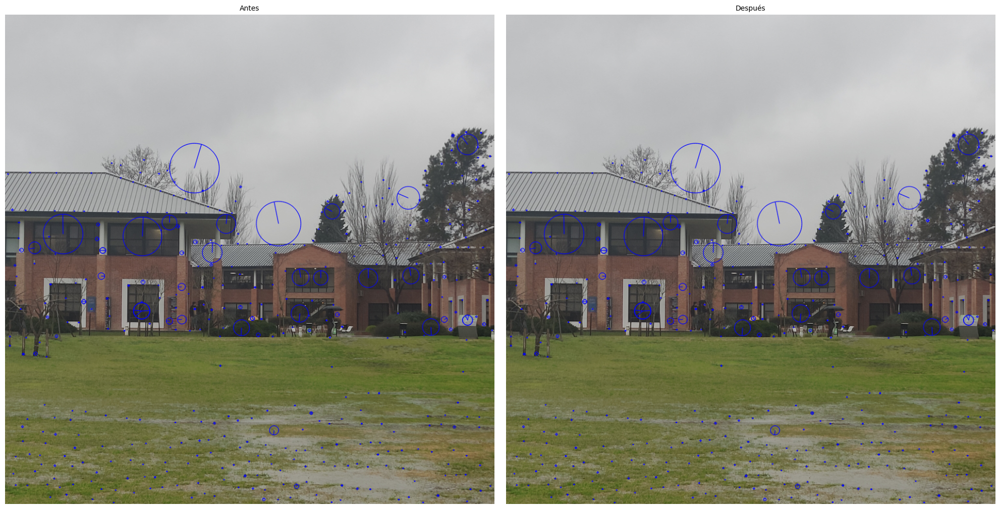

In [17]:
imagen1_udesa_antes = cv2.drawKeypoints(img1_udesa_color, keypoints1_udesa_anms, 0, (255, 0, 0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
imagen1_udesa_despues = cv2.drawKeypoints(img1_udesa_color, keypoints1_udesa_anms, 0, (255, 0, 0), flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

show_images([imagen1_udesa_antes, imagen1_udesa_despues], titles = ['Antes', 'Después'], figsize=(20,10))

### *Asociación de características (Matching)*

Para eset paso, utilizaremos las imagenes 1 como anclas, ya que son las que deberían ir al medio de la imagen completa

#### **Cross Check**

In [18]:
# Usando la imagen 1 como ancla...
matches_0_1_cuadro_cc = obtener_matches_cross_check(des0_cuadro_anms, des1_cuadro_anms)
matches_2_1_cuadro_cc = obtener_matches_cross_check(des2_cuadro_anms, des1_cuadro_anms)

matches_0_1_udesa_cc = obtener_matches_cross_check(des0_udesa_anms, des1_udesa_anms)
matches_2_1_udesa_cc = obtener_matches_cross_check(des2_udesa_anms, des1_udesa_anms)

print("CUADRO")
print(f"Matches 0 -> 1: {len(matches_0_1_cuadro_cc)}")
print(f"Matches 2 -> 1: {len(matches_2_1_cuadro_cc)}")

print("UDESA")
print(f"Matches 0 -> 1: {len(matches_0_1_udesa_cc)}")
print(f"Matches 2 -> 1: {len(matches_2_1_udesa_cc)}")

CUADRO
Matches 0 -> 1: 84
Matches 2 -> 1: 74
UDESA
Matches 0 -> 1: 186
Matches 2 -> 1: 168


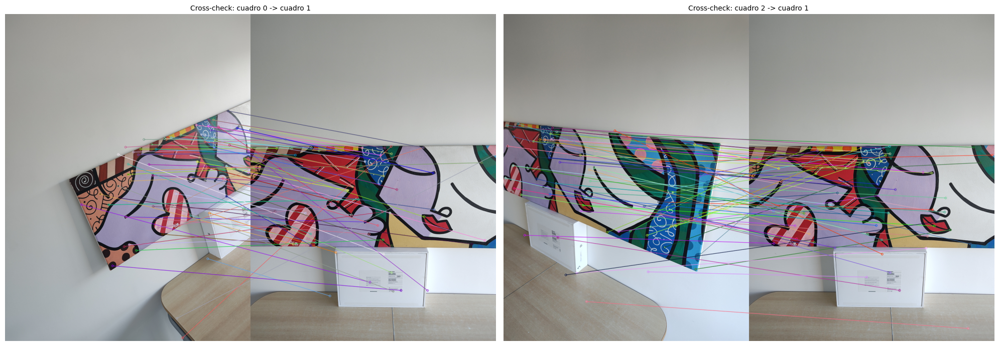

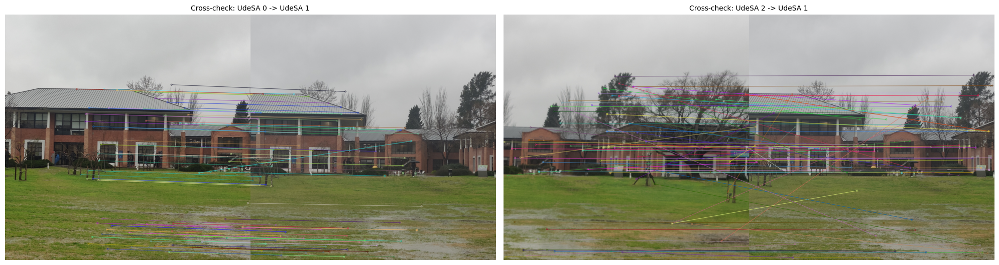

In [19]:
# Visualizamos

# Cuadro
matches_a_mostrar = 80

img_matches_0_1_cuadro_cc = cv2.drawMatches(img0_cuadro_color, keypoints0_cuadro_anms, img1_cuadro_color,
                                            keypoints1_cuadro_anms, matches_0_1_cuadro_cc[:matches_a_mostrar], None,
                                            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

img_matches_2_1_cuadro_cc = cv2.drawMatches(img2_cuadro_color, keypoints2_cuadro_anms, img1_cuadro_color,
                                            keypoints1_cuadro_anms, matches_2_1_cuadro_cc[:matches_a_mostrar], None,
                                            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

show_images([img_matches_0_1_cuadro_cc, img_matches_2_1_cuadro_cc], titles=["Cross-check: cuadro 0 -> cuadro 1", "Cross-check: cuadro 2 -> cuadro 1"], figsize=(20, 8))


# Udesa
img_matches_0_1_udesa_cc = cv2.drawMatches(img0_udesa_color, keypoints0_udesa_anms, img1_udesa_color,
                                           keypoints1_udesa_anms, matches_0_1_udesa_cc[:matches_a_mostrar], None,
                                           flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

img_matches_2_1_udesa_cc = cv2.drawMatches(img2_udesa_color, keypoints2_udesa_anms, img1_udesa_color,
                                           keypoints1_udesa_anms, matches_2_1_udesa_cc[:matches_a_mostrar], None,
                                           flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

show_images([img_matches_0_1_udesa_cc, img_matches_2_1_udesa_cc], titles=["Cross-check: UdeSA 0 -> UdeSA 1", "Cross-check: UdeSA 2 -> UdeSA 1"], figsize=(20, 8))

#### **FLANN + Lowe Ratio**

In [20]:
matches_0_1_cuadro_flann = obtener_matches_flann_lowe(des0_cuadro_anms, des1_cuadro_anms, ratio=0.75)
matches_2_1_cuadro_flann = obtener_matches_flann_lowe(des2_cuadro_anms, des1_cuadro_anms, ratio=0.75)

matches_0_1_udesa_flann = obtener_matches_flann_lowe(des0_udesa_anms, des1_udesa_anms, ratio=0.75)
matches_2_1_udesa_flann = obtener_matches_flann_lowe(des2_udesa_anms, des1_udesa_anms, ratio=0.75)

print("CUADRO")
print(f"Matches 0 -> 1: {len(matches_0_1_cuadro_flann)}")
print(f"Matches 2 -> 1: {len(matches_2_1_cuadro_flann)}")

print("UDESA")
print(f"Matches 0 -> 1: {len(matches_0_1_udesa_flann)}")
print(f"Matches 2 -> 1: {len(matches_2_1_udesa_flann)}")

CUADRO
Matches 0 -> 1: 52
Matches 2 -> 1: 34
UDESA
Matches 0 -> 1: 114
Matches 2 -> 1: 46


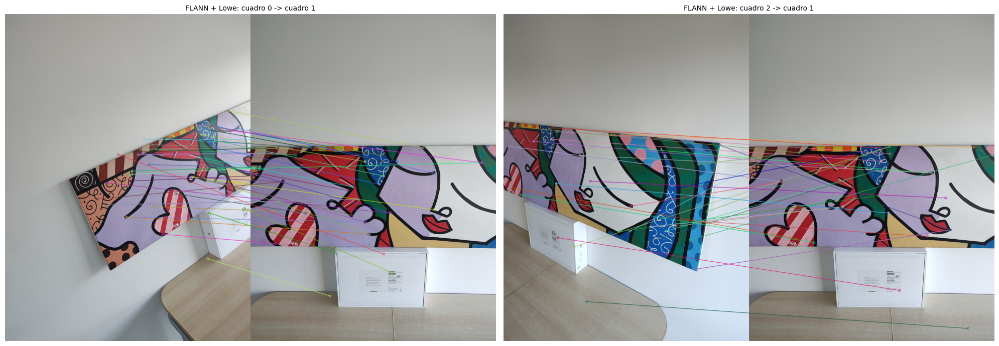

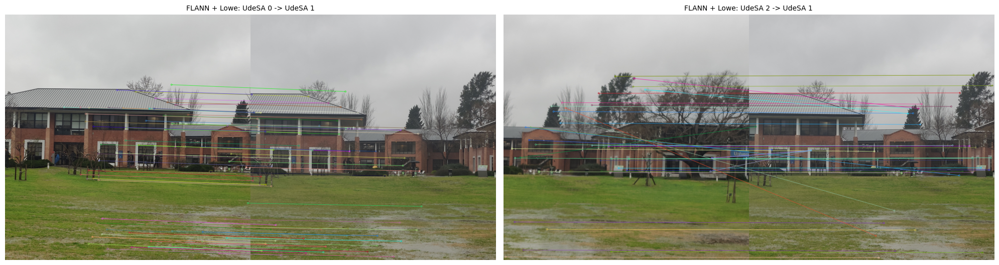

In [21]:
# Visualizamos

# Cuadro
matches_a_mostrar = 80

img_matches_0_1_cuadro_flann = cv2.drawMatches(img0_cuadro_color, keypoints0_cuadro_anms,
                                               img1_cuadro_color, keypoints1_cuadro_anms, matches_0_1_cuadro_flann[:matches_a_mostrar], 
                                               None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

img_matches_2_1_cuadro_flann = cv2.drawMatches( img2_cuadro_color, keypoints2_cuadro_anms, img1_cuadro_color, 
                                               keypoints1_cuadro_anms, matches_2_1_cuadro_flann[:matches_a_mostrar],
                                               None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

show_images( [img_matches_0_1_cuadro_flann, img_matches_2_1_cuadro_flann], titles=["FLANN + Lowe: cuadro 0 -> cuadro 1", "FLANN + Lowe: cuadro 2 -> cuadro 1"], figsize=(20, 8))

# udesa
img_matches_0_1_udesa_flann = cv2.drawMatches(img0_udesa_color, keypoints0_udesa_anms, img1_udesa_color,
                                              keypoints1_udesa_anms, matches_0_1_udesa_flann[:matches_a_mostrar],
                                              None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

img_matches_2_1_udesa_flann = cv2.drawMatches(img2_udesa_color, keypoints2_udesa_anms, img1_udesa_color,
                                              keypoints1_udesa_anms, matches_2_1_udesa_flann[:matches_a_mostrar],
                                              None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

show_images([img_matches_0_1_udesa_flann, img_matches_2_1_udesa_flann], titles=["FLANN + Lowe: UdeSA 0 -> UdeSA 1", "FLANN + Lowe: UdeSA 2 -> UdeSA 1"], figsize=(20, 8))

#### **Comparando**

In [22]:
resumen_matches(matches_0_1_udesa_cc, "Cross-check UdeSA 0 -> 1")
resumen_matches(matches_2_1_udesa_cc, "Cross-check UdeSA 2 -> 1")

resumen_matches(matches_0_1_udesa_flann, "FLANN + Lowe UdeSA 0 -> 1")
resumen_matches(matches_2_1_udesa_flann, "FLANN + Lowe UdeSA 2 -> 1")

Cross-check UdeSA 0 -> 1
Cantidad: 186
Distancia media: 177.16
Distancia mediana: 176.21
Distancia mínima: 20.12
Distancia máxima: 385.45

Cross-check UdeSA 2 -> 1
Cantidad: 168
Distancia media: 241.34
Distancia mediana: 253.85
Distancia mínima: 51.09
Distancia máxima: 375.66

FLANN + Lowe UdeSA 0 -> 1
Cantidad: 114
Distancia media: 117.88
Distancia mediana: 108.87
Distancia mínima: 20.12
Distancia máxima: 273.97

FLANN + Lowe UdeSA 2 -> 1
Cantidad: 46
Distancia media: 155.40
Distancia mediana: 150.20
Distancia mínima: 51.09
Distancia máxima: 283.47



ELEGIR CON CUAL ME QUEDO --> FLANNNN 

### *Estimación de la homografía “manualmente"*

Este inciso lo resolveremos para la imagen el cuadro.

En primer lugar, graficamos la imagen para observar coordenadas aproximadas.

In [ ]:
%matplotlib inline

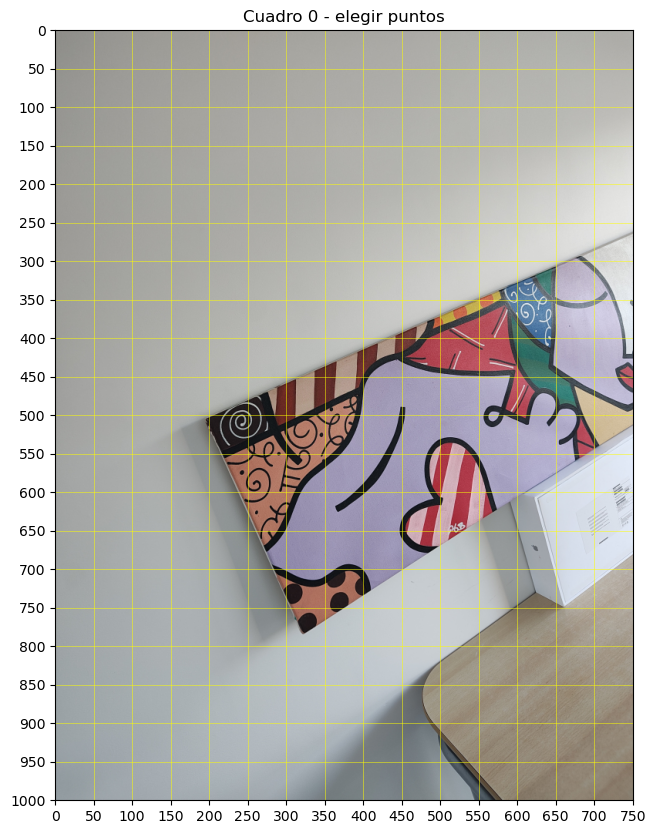

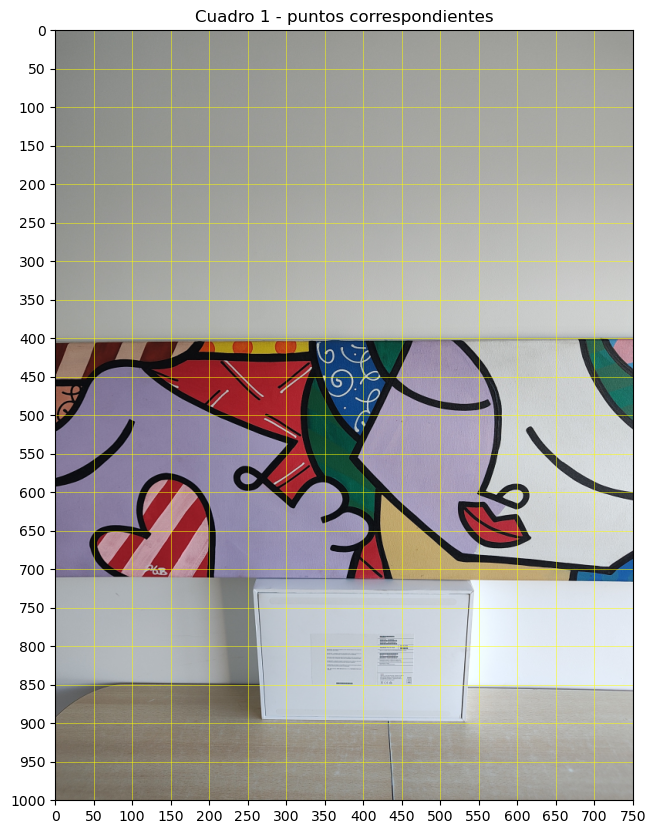

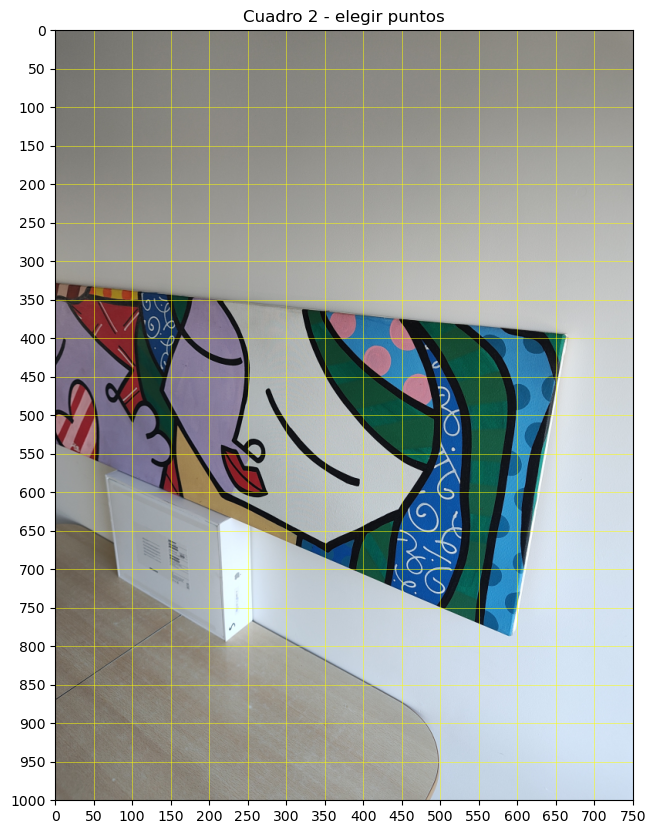

In [28]:
mostrar_imagen_con_grilla(img0_cuadro_color, titulo="Cuadro 0 - elegir puntos", paso=50, figsize=(12, 10))

mostrar_imagen_con_grilla(img1_cuadro_color, titulo="Cuadro 1 - puntos correspondientes", paso=50, figsize=(12, 10))

mostrar_imagen_con_grilla(img2_cuadro_color, titulo="Cuadro 2 - elegir puntos", paso=50, figsize=(12, 10))

In [ ]:
pts0_cuadro = np.array([
    [215, 505],  # esquina superior izquierda visible del cuadro
    [700, 300],  # esquina superior derecha visible del cuadro
    [690, 535],  # esquina inferior derecha visible del cuadro
    [310, 765],  # esquina inferior izquierda visible del cuadro
], dtype=np.float32)

pts1_para_0_cuadro = np.array([
    [0, 405],    # misma esquina/borde izquierdo del cuadro en imagen 1
    [410, 405],  # mismo punto del borde superior
    [410, 710],  # mismo punto del borde inferior
    [95, 710],   # mismo punto del borde inferior izquierdo
], dtype=np.float32)

In [ ]:
pts2_cuadro = np.array([
    [0, 340],    # borde superior izquierdo visible
    [650, 400],  # borde superior derecho del cuadro
    [590, 755],  # esquina inferior derecha del cuadro
    [0, 555],    # borde inferior izquierdo visible
], dtype=np.float32)

pts1_para_2_cuadro = np.array([
    [310, 405],  # mismo punto/borde superior en imagen 1
    [750, 405],  # extremo derecho superior visible
    [735, 705],  # extremo derecho inferior visible
    [440, 710],  # mismo borde inferior izquierdo visible
], dtype=np.float32)

In [ ]:
H_0_to_1_manual = dlt(pts0_cuadro, pts1_para_0_cuadro)
H_2_to_1_manual = dlt(pts2_cuadro, pts1_para_2_cuadro)